In [1]:
import torch

# To resolve memory leaks giving received 0 items from anecdata
# Reference link https://github.com/pytorch/pytorch/issues/973
torch.multiprocessing.set_sharing_strategy("file_system")
from torch.utils.data import DataLoader
import os
import sys
import json
# sys.path.append("/fsx-repligen/piyusht1/projects/uCO3D/uco3d/")
# sys.path.append("../../uco3d/")
from uco3d.uco3d_dataset import UCO3DDataset, UCO3DFrameDataBuilder
from uco3d.dataset_utils.scene_batch_sampler import (
    SceneBatchSampler,
)
from uco3d.dataset_utils.sql_dataset import SqlIndexDataset


from pytorch3d.renderer.cameras import PerspectiveCameras

from PIL import Image
import pandas as pd
import sqlalchemy as sa

A few examples of Arguments which can be given to the dataset constructor. Replace DATASET_ROOT with the folder where the dataset videos/point_clouds/cameras exist. 

In [2]:
DATASET_ROOT = "/fsx-repligen/shared/datasets/uCO3D/batch_reconstruction/dataset_export"
# METADATA_FILE = os.path.join(DATASET_ROOT, "metadata_vggsfm.sqlite")
METADATA_FILE = os.path.join(DATASET_ROOT, "metadata_vgg_1102_170k.sqlite")
# METADATA_FILE = "/fsx-repligen/shared/datasets/uCO3D/tmp_romansh_export/metadata_1729602322.8402915.sqlite"
# METADATA_FILE = "/fsx-repligen/shared/datasets/uCO3D/batch_reconstruction/dataset_export/metadata_all_updated.sqlite"

NO_BLOBS_KWARGS = {
    "dataset_root": "",
    "load_images": False,
    "load_depths": False,
    "load_masks": False,
    "load_depth_masks": False,
    "box_crop": False,
    "image_height": 800,
}
SCENE_BATCH_SAMPLER_KWARGS = {
    "dataset_root": "",
    # "image_height": 800,
    # "image_width": 800,
    "load_depths": False,
    # "load_frames_from_videos": False,
}


In [3]:
from uco3d import uco3d_dataset
print(uco3d_dataset.__file__)

/opt/hpcaas/.mounts/fs-0663e2d3c38211883/home/romansh/src/uCO3D/uco3d/uco3d/uco3d_dataset.py


Can create frame_data_builder explicitly and pass to it dataset contructor or use frame_data_builder_args and pass it to dataset constructor. frame_data_builder_args is a cleaner way to do so, and is what is used here


In [4]:
#%%timeit -r 2

# frame_data_builder_args = NO_BLOBS_KWARGS
# frame_data_builder_args = SCENE_BATCH_SAMPLER_KWARGS

frame_data_builder = UCO3DFrameDataBuilder(
    # dataset_root="/fsx-repligen/piyusht1/projects/uCO3D_SfM/export_reconstruction_2000/dataset_export",
    dataset_root=DATASET_ROOT,
    load_frames_from_videos=True,
    load_depths=False,
    image_height = 800,
    load_point_clouds=True,
)

dataset = UCO3DDataset(
    # dataset_root="/fsx-repligen/piyusht1/projects/uCO3D_SfM/export_reconstruction_2000/dataset_export",
    dataset_root=DATASET_ROOT,
    sqlite_metadata_file=METADATA_FILE,
    remove_empty_masks=False,
    # frame_data_builder_args = frame_data_builder_args | {"load_depths": False},
    frame_data_builder = frame_data_builder,
    #subset_lists_file="/fsx-repligen/shared/datasets/uCO3D/batch_reconstruction/dataset_export/set_lists/set_lists_allcat_val1100.sqlite",
    #subset_lists_file="/tmp/romansh/set_lists_allcat_val1100.sqlite",
    #subsets=["train"],
    limit_sequences_to=10000,
)

For sampling, can create a pytorch DataLoader object. Following is an example of Dataloading with sampler as SceneBatchSampler, which selects certain number of instances from a sequence for a batch (In this code, number of samples for a batch is set to 48, and instances per sequence are set to 8)

In [4]:
for i in range(len(dataset)):
    dataset[i]


MAE tensor(2.0117e-07)
MAE tensor(2.7567e-07)
MAE tensor(1.5646e-07)
MAE tensor(1.6391e-07)
MAE tensor(1.0431e-07)
MAE tensor(6.7055e-08)
MAE tensor(7.4506e-08)
MAE tensor(1.6391e-07)
MAE tensor(1.2666e-07)
MAE tensor(9.6858e-08)
MAE tensor(2.0117e-07)
MAE tensor(2.0862e-07)
MAE tensor(1.7881e-07)
MAE tensor(1.7881e-07)
MAE tensor(1.6391e-07)
MAE tensor(5.5879e-08)
MAE tensor(8.1956e-08)
MAE tensor(2.3097e-07)
MAE tensor(1.7881e-07)
MAE tensor(8.1956e-08)
MAE tensor(3.7253e-08)
MAE tensor(2.9802e-08)
MAE tensor(1.6391e-07)
MAE tensor(3.1292e-07)
MAE tensor(1.9372e-07)
MAE tensor(1.4901e-07)
MAE tensor(1.8626e-07)
MAE tensor(1.4156e-07)
MAE tensor(1.6391e-07)
MAE tensor(6.7055e-08)
MAE tensor(1.1176e-07)
MAE tensor(6.7055e-08)
MAE tensor(1.9372e-07)
MAE tensor(4.4703e-08)
MAE tensor(1.9372e-07)
MAE tensor(5.2154e-08)
MAE tensor(7.4506e-08)
MAE tensor(2.0117e-07)
MAE tensor(1.8626e-07)
MAE tensor(1.2666e-07)
MAE tensor(1.1176e-07)
MAE tensor(1.9372e-07)
MAE tensor(7.0781e-08)
MAE tensor(

Traceback (most recent call last):
  File "/data/home/romansh/miniconda/envs/pt20/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3508, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/tmp/ipykernel_392615/3453569003.py", line 2, in <module>
    dataset[i]
  File "/opt/hpcaas/.mounts/fs-0663e2d3c38211883/home/romansh/src/uCO3D/uco3d/uco3d/dataset_utils/sql_dataset.py", line 192, in __getitem__
    return self._get_item(frame_idx, True)
  File "/opt/hpcaas/.mounts/fs-0663e2d3c38211883/home/romansh/src/uCO3D/uco3d/uco3d/uco3d_dataset.py", line 75, in _get_item
    frame_data = self.frame_data_builder.build(
  File "/opt/hpcaas/.mounts/fs-0663e2d3c38211883/home/romansh/src/uCO3D/uco3d/uco3d/uco3d_frame_data.py", line 154, in build
    fg_mask_np = self._frame_from_video(
  File "/opt/hpcaas/.mounts/fs-0663e2d3c38211883/home/romansh/src/uCO3D/uco3d/uco3d/uco3d_frame_data.py", line 400, in _frame_from_video
  File "/opt/hpcaas/.mounts/fs-0663e2

In [5]:
len(dataset)/200

9997.495

In [6]:
dataset._index.index.get_level_values('sequence_name').nunique()

10000

In [7]:
def to_profile():
    dataset = UCO3DDataset(
        # dataset_root="/fsx-repligen/piyusht1/projects/uCO3D_SfM/export_reconstruction_2000/dataset_export",
        dataset_root=DATASET_ROOT,
        sqlite_metadata_file=METADATA_FILE,
        remove_empty_masks=False,
        frame_data_builder_args = frame_data_builder_args | {"load_depths": False},
        subset_lists_file="/tmp/romansh/set_lists_allcat_val1100.sqlite",
        subsets=["train"],
        # limit_sequences_to=10000,
    )

In [16]:
%load_ext line_profiler

In [8]:
frame_data_builder_args = SCENE_BATCH_SAMPLER_KWARGS
%prun to_profile()

         9284 function calls (9070 primitive calls) in 133.535 seconds

   Ordered by: internal time

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
        2   28.950   14.475   33.391   16.696 multi.py:1083(_engine)
        8   25.310    3.164   25.310    3.164 {method 'fetchall' of 'sqlite3.Cursor' objects}
        8   25.048    3.131   25.049    3.131 result.py:551(<listcomp>)
       20   11.435    0.572   11.489    0.574 {pandas._libs.lib.maybe_convert_objects}
       13    6.417    0.494    6.417    0.494 {pandas._libs.algos.take_1d_int64_int64}
        1    5.162    5.162    5.162    5.162 {pandas._libs.lib.to_object_array_tuples}
        6    4.309    0.718    6.931    1.155 managers.py:2279(_merge_blocks)
       27    4.300    0.159    4.300    0.159 {method 'reduce' of 'numpy.ufunc' objects}
        2    3.177    1.589    3.177    1.589 {method 'factorize' of 'pandas._libs.hashtable.StringHashTable' objects}
       13    2.880    0.222    2.880    0.2

In [9]:
images_per_seq_options = [8]
scene_batch_sampler = SceneBatchSampler(
    dataset=dataset,
    batch_size=48,
    num_batches=1,
    images_per_seq_options=images_per_seq_options,
)

# def my_collate_fn(batch):
#     return [batch]

num_workers = 0
dataloader = DataLoader(
    dataset,
    batch_sampler=scene_batch_sampler,
    num_workers=num_workers,
    collate_fn=dataset.frame_data_type.collate,
)

## Example to get the batches
for i,data in enumerate(dataloader):
    print(f"Batch Number {i}")

KeyboardInterrupt: 

In [9]:
sequences = dataset.sequence_names()
seq = sequences[1]
print("Number of sequences:", len(sequences))
print("Sequence name:", seq)

# sequence_frames_in_order returns an iterator over (timestamp, frame_id, global_index)
# frame_id is unique within a sequence; global_index is unique within the dataset
# to get length, we convert it to a list
seq_frame_ids = list(dataset.sequence_frames_in_order(seq))
print("Number of frames in the sequence:", len(seq_frame_ids))
ts, frame_id, idx = seq_frame_ids[42]

Number of sequences: 10000
Sequence name: 1-30564-94607
Number of frames in the sequence: 200


We provide two equvalent ways of indexing the dataset: by global ordinal index, and by (sequence, frame_id) pairs. dataset[idx] returns a Uco3dFrameData dataclass object that contains metadata fields such as frame_timestamp and camera pose, and tensors like image_rgb and fg_probability. dataset.meta[] accessor does not load any blobs such as image and mask – so that those fields stay None, but provides camera poses.

In [10]:
dataset[0]

FileNotFoundError: [Errno 2] No such file or directory: '/fsx-repligen/shared/datasets/uCO3D/batch_reconstruction/dataset_export/point_clouds/1-28687-8079/pointcloud.ply'

In [6]:
assert dataset.meta[idx].sequence_name == dataset.meta[seq, frame_id].sequence_name
assert dataset.meta[idx].frame_number == dataset.meta[seq, frame_id].frame_number
assert dataset.meta[seq, frame_id].image_rgb is None

# Use dataset[] to load the full frame data
frame = dataset[seq, frame_id]
assert frame.sequence_name == dataset.meta[seq, frame_id].sequence_name
assert frame.frame_number == dataset.meta[seq, frame_id].frame_number
assert frame.image_rgb is not None

Showing sequence 1-30564-94607


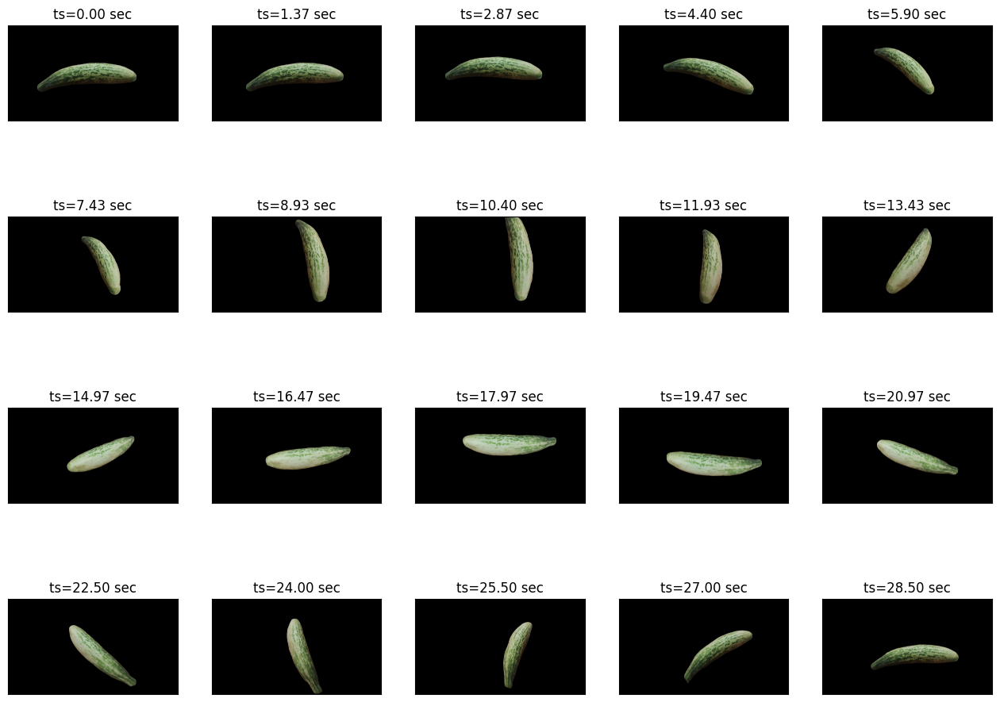

In [7]:
from pytorch3d.vis.plotly_vis import plot_scene
from IPython.display import display
from matplotlib import pyplot as plt


print("Showing sequence", seq)
n_vis_frames = 20
n_image_cols = 5
ax = plt.figure(figsize=(16, 12)).subplots(-(-n_vis_frames // n_image_cols), n_image_cols).reshape(-1)
for slot in ax:
    slot.get_xaxis().set_visible(False)
    slot.get_yaxis().set_visible(False)

interval = len(seq_frame_ids) // n_vis_frames
for slot, (_, frame_id, _) in zip(ax, seq_frame_ids[::interval]):
    frame = dataset[seq, frame_id]  # loading and cropping happens on this call
    masked_im = frame.image_rgb * frame.fg_probability
    slot.imshow(masked_im.permute(1, 2, 0).data.numpy())
    slot.set_title(f"ts={frame.frame_timestamp:.2f} sec")

#Visualize depths
visualize_depths = False
if visualize_depths:
    ax = plt.figure(figsize=(16, 12)).subplots(-(-n_vis_frames // n_image_cols), n_image_cols).reshape(-1)
    for slot in ax:
        slot.get_xaxis().set_visible(False)
        slot.get_yaxis().set_visible(False)

    interval = len(seq_frame_ids) // n_vis_frames
    for slot, (_, frame_id, _) in zip(ax, seq_frame_ids[::interval]):
        frame = dataset[seq, frame_id]  # loading and cropping happens on this call
        masked_im = frame.depth_map * frame.fg_probability
        slot.imshow(masked_im.permute(1, 2, 0).data.numpy())
        slot.set_title(f"ts={frame.frame_timestamp:.2f} sec")

plotly widget with 3D camera poses . To convert camera to pytorch3d representation, use the _get_pytorch3d_camera_from_uco3d_camera function here

In [7]:
from pytorch3d.structures import Pointclouds

In [102]:
dataset[seq, frame_id].sequence_point_cloud

PointCloud(xyz=tensor([[ 0.0966,  0.9595,  1.6230],
        [ 0.2226,  1.1093,  1.8800],
        [-0.2369,  1.6857,  1.3184],
        ...,
        [-0.2054,  1.6081,  1.3705],
        [-0.7749,  1.5612,  1.6155],
        [ 0.1260,  1.3352,  2.5561]]), rgb=tensor([[118, 126, 122],
        [ 98, 105,  99],
        [ 68,  89,  77],
        ...,
        [ 41,  60,  41],
        [ 36,  54,  44],
        [ 42,  61,  47]]))

MAE tensor(7.8231e-08)


In [158]:
merged_pc = Pointclouds(torch.concatenate(all_points, dim=0)[None], features=torch.concatenate(all_features, dim=0)[None])

In [159]:
len(merged_pc.points_packed())

17443

In [21]:
seq = sequences[5]
pc = dataset[seq, frame_id].sequence_point_cloud
pc_pt3d = Pointclouds(pc.xyz[None], features=pc.rgb[None] / 255.0)

MAE tensor(3.7253e-08)


In [9]:
from pytorch3d.renderer.camera_utils import join_cameras_as_batch

def _get_pytorch3d_camera_from_uco3d_camera(
    camera,
) -> PerspectiveCameras:
    assert camera is not None
    return PerspectiveCameras(
        focal_length=camera.focal_length,
        principal_point=camera.principal_point,
        R=camera.R,
        T=camera.T,
    )

# cameras = join_cameras_as_batch([_get_pytorch3d_camera_from_uco3d_camera(dataset.meta[seq, frame_id].camera) for _, frame_id, _ in seq_frame_ids[::interval]])
# TEMP
cameras = join_cameras_as_batch([_get_pytorch3d_camera_from_uco3d_camera(dataset[seq, frame_id].camera) for _, frame_id, _ in seq_frame_ids[::interval]])
plot_scene({"main": {
    "cameras": cameras,
    "pointcloud": pc_pt3d,
    # "pointcloud": merged_pc,
}}, camera_scale=0.3)

NameError: name 'pc_pt3d' is not defined

In [41]:
frame_id = 0

In [10]:
points = torch.tensor(dataset[seq, frame_id].sequence_point_cloud.elements[0].data[['x', 'y', 'z']].tolist())
rgb = torch.tensor(dataset[seq, frame_id].sequence_point_cloud.elements[0].data[['red', 'green', 'blue']].tolist())

TEMP: distortion [[0.03457963 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.        ]]


AttributeError: 'list' object has no attribute 'elements'

In [13]:
from pytorch3d.renderer.cameras import PerspectiveCameras

def _get_pytorch3d_camera_from_uco3d_camera(
    camera,
) -> PerspectiveCameras:
    assert camera is not None
    return PerspectiveCameras(
        focal_length=camera.focal_length,
        principal_point=camera.principal_point,
        R=camera.R,
        T=camera.T,
    )

In [10]:
imsize = torch.tensor(dataset[seq, frame_id].image_rgb.shape[::-1])
cam = _get_pytorch3d_camera_from_uco3d_camera(dataset[seq, frame_id].camera)

points_ndc = cam.transform_points(dataset[seq, frame_id].sequence_point_cloud.xyz)
points_xy = (-points_ndc * imsize[:2].min() + imsize) / 2.0
rgb = dataset[seq, frame_id].sequence_point_cloud.rgb

In [127]:
points_ndc

tensor([[ 1.0272,  0.3313,  0.5604],
        [ 1.9573,  0.1132,  0.5087],
        [ 2.9593, -0.2302,  0.6248],
        ...,
        [-1.8076, -0.9700,  0.9141],
        [ 3.0995, -0.5099,  0.7208],
        [-2.5924, -1.1782,  0.9968]])

(0.0, 2000.0)

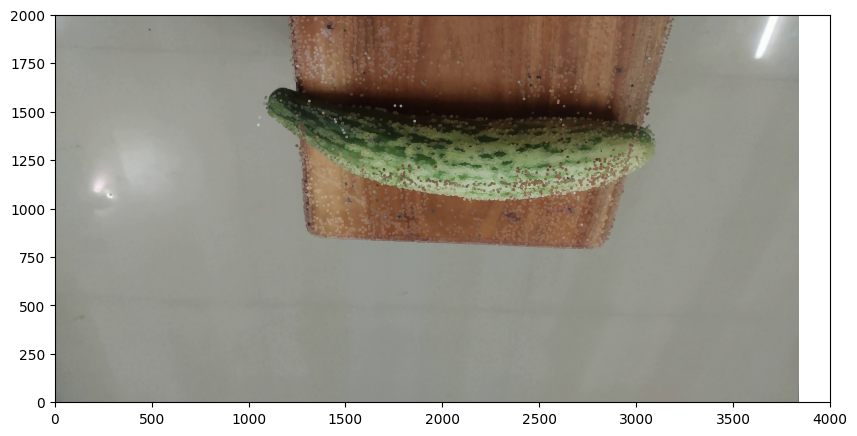

In [13]:
plt.figure(figsize=(10,10))
plt.imshow(dataset[seq, frame_id].image_rgb.permute(1, 2, 0))
plt.scatter(points_xy[:,0], points_xy[:,1], s=1.0, c=rgb.float().data.numpy()/255.)
plt.xlim(0, 4000)
plt.ylim(0, 2000)

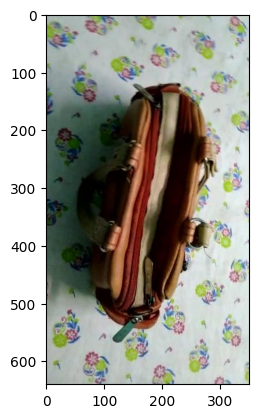

In [103]:
plt.imshow(plt.imread(undist))

In [62]:
points_xy

tensor([[884.4682, 520.0618,   1.7893],
        [431.4709, 277.1718,   1.8493],
        [822.9469, 432.6943,   1.7832],
        ...,
        [945.1326, 426.9982,   1.7987],
        [787.3041,  91.5037,   1.7854],
        [453.9946, 507.0177,   1.7317]])

In [115]:
undist = "/fsx-repligen/shared/datasets/uCO3D/batch_reconstruction/12968-5258-28511/mapper_output/0/dense/undistort/images/default_default/frame0000001.jpg"

In [122]:
dist = plt.imread("/fsx-repligen/shared/datasets/uCO3D/batch_reconstruction/12968-5258-28511/video_frames/default_default/frame0000001.jpg") / 255

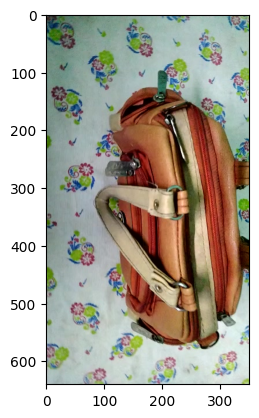

In [119]:
plt.imshow(dist)

In [134]:
im1 = dataset[seq, frame_id].image_rgb.permute(1, 2, 0).numpy()[:, :, ::-1]

In [116]:
im2 = plt.imread(undist).astype(np.float32) / 255

In [120]:
dist.shape, im2.shape

((640, 352, 3), (640, 352, 3))

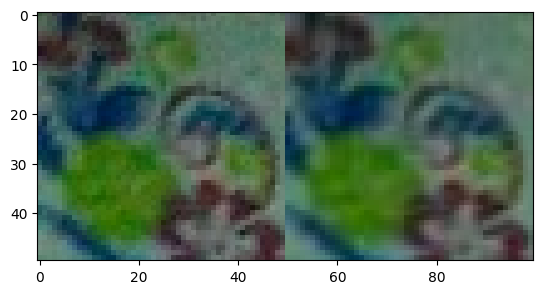

In [123]:
plt.imshow(np.hstack((dist[:50, :50], im2[:50, :50])))

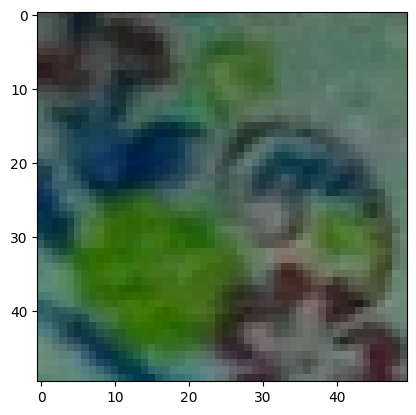

In [124]:
plt.imshow((dist[:50, :50] + im2[:50, :50]) / 2.0)

In [117]:
im2

array([[[169, 180, 170],
        [169, 180, 170],
        [171, 179, 169],
        ...,
        [179, 181, 169],
        [185, 183, 172],
        [186, 184, 173]],

       [[171, 180, 170],
        [171, 180, 170],
        [171, 179, 169],
        ...,
        [180, 182, 170],
        [184, 184, 172],
        [186, 184, 173]],

       [[172, 180, 170],
        [172, 180, 170],
        [171, 179, 169],
        ...,
        [180, 182, 170],
        [184, 184, 172],
        [185, 185, 173]],

       ...,

       [[177, 172, 157],
        [177, 170, 155],
        [174, 161, 147],
        ...,
        [151, 180, 155],
        [167, 178, 158],
        [178, 179, 163]],

       [[166, 166, 152],
        [171, 170, 156],
        [175, 172, 157],
        ...,
        [150, 179, 154],
        [167, 179, 161],
        [177, 180, 165]],

       [[169, 172, 157],
        [171, 174, 159],
        [176, 176, 160],
        ...,
        [148, 177, 152],
        [168, 178, 161],
        [176, 179, 164]]

In [35]:
from pytorch3d.implicitron.dataset.frame_data import FrameDataBuilder
from pytorch3d.implicitron.dataset.sql_dataset import SqlIndexDataset

In [43]:
frame_data_builder_args = SCENE_BATCH_SAMPLER_KWARGS | {"load_depths": False, "dataset_root": "/fsx-repligen/shared/datasets/co3d/"}
frame_data_builder = FrameDataBuilder(**frame_data_builder_args)

In [39]:
SCENE_BATCH_SAMPLER_KWARGS

{'dataset_root': '', 'load_depths': False}

In [50]:
dataset_old = SqlIndexDataset(
    dataset_root="/fsx-repligen/shared/datasets/co3d/",
    sqlite_metadata_file="/fsx-repligen/shared/datasets/co3d/metadata.sqlite",
    remove_empty_masks=False,   
    frame_data_builder_FrameDataBuilder_args=frame_data_builder_args,
    # limit_sequences_to=10000,
)

The slowest run took 4.33 times longer than the fastest. This could mean that an intermediate result is being cached.
1min 2s ± 25.1 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [51]:
len(dataset_old)

NameError: name 'dataset_old' is not defined

In [47]:
SqlIndexDataset.__init__?

Signature:
SqlIndexDataset.__init__(
    self,
    frame_annotation_has_material: bool = False,
    sqlite_metadata_file: str = '',
    dataset_root: Optional[str] = None,
    subset_lists_file: str = '',
    eval_batches_file: Optional[str] = None,
    path_manager: Any = None,
    subsets: Optional[List[str]] = None,
    remove_empty_masks: bool = True,
    pick_frames_sql_clause: Optional[str] = None,
    pick_categories: Tuple[str, ...] = (),
    pick_sequences: Tuple[str, ...] = (),
    exclude_sequences: Tuple[str, ...] = (),
    limit_sequences_per_category_to: int = 0,
    limit_sequences_to: int = 0,
    limit_to: int = 0,
    n_frames_per_sequence: int = -1,
    seed: int = 0,
    remove_empty_masks_poll_whole_table_threshold: int = 300000,
    preload_metadata: bool = False,
    precompute_seq_to_idx: bool = False,
    frame_data_builder_class_type: str = 'FrameDataBuilder',
    raw_sql_queries: bool = False,
    scoped_session: bool = False,
    frame_data_builder_FrameData

In [170]:
with open("/fsx-repligen/shared/datasets/uCO3D/vgg_additional/vggsfm_additional.txt") as f:
    lines = f.readlines()

In [172]:
len(set(lines))

101511

In [173]:
import random

In [179]:
random.choice(lines)

'41702-44635-2275\n'

In [178]:
np.random.choice(3, size=[2]).dtype

dtype('int64')

In [180]:
with open("/fsx-repligen/shared/datasets/uCO3D/vgg_additional/vggsfm_additional_corrupted.txt", "r") as f:
    corrupted = f.readlines()

In [181]:
len(corrupted)

2697

In [182]:
def has_bak(seq):
    return os.path.isdir(f"/fsx-repligen/shared/datasets/uCO3D/batch_reconstruction/{seq}/mapper_output/gsplat_output/compression/rank0.bak")

In [183]:
sum(int(has_bak(seq.strip())) for seq in corrupted)

77

In [184]:
corrupted_set = {s.strip() for s in corrupted}

In [186]:
"277-58413-10111" in corrupted_set

False

In [274]:
def sequence_pc_normalised(seq):
    seq_frame_ids = list(dataset.sequence_frames_in_order(seq))
    orig_point_cloud = dataset[seq, seq_frame_ids[0].frame_number].sequence_point_cloud

    normalisation_json = f"/fsx-repligen/shared/datasets/uCO3D/batch_reconstruction/{seq}/mapper_output/0/normalization.json"
    print(normalisation_json)
    if not os.path.isfile(normalisation_json):
        return None, None

    with open(normalisation_json) as f:
        normalisation = json.load(f)

    R = torch.tensor(normalisation["rotation"])
    T = torch.tensor(normalisation["translation"])
    s = torch.tensor(normalisation["scale"])

    orig_point_cloud.xyz = (orig_point_cloud.xyz @ R + T) * s
    orig_point_cloud_pt3d = Pointclouds(orig_point_cloud.xyz[None], features=orig_point_cloud.rgb[None] / 255.0)

    return normalisation, orig_point_cloud_pt3d



In [218]:
norm, pc = sequence_pc_normalised("33-9500-51072")

/fsx-repligen/shared/datasets/uCO3D/batch_reconstruction/33-9500-51072/mapper_output/0/normalization.json


In [278]:
# aligned_pcs = {seq: sequence_pc_normalised(seq)[1] for seq in truck_sequences[-96:-64]}
aligned_pcs = {seq: sequence_pc_normalised(seq)[1] for seq in truck_seq_with_norm}

/fsx-repligen/shared/datasets/uCO3D/batch_reconstruction/153-64883-7656/mapper_output/0/normalization.json
/fsx-repligen/shared/datasets/uCO3D/batch_reconstruction/93-27562-23244/mapper_output/0/normalization.json
/fsx-repligen/shared/datasets/uCO3D/batch_reconstruction/33-9500-51072/mapper_output/0/normalization.json


In [263]:
aligned_pcs

{'352-55604-64211': None,
 '259-75841-93540': None,
 '396-50946-35765': None,
 '282-89471-49009': None,
 '320-98925-65029': None,
 '305-75635-85166': None,
 '87-79145-63012': None,
 '285-64995-76969': None,
 '358-50929-91540': None,
 '363-30707-22869': None,
 '127-12033-90446': None,
 '121-3868-31768': None,
 '70-93126-69468': None,
 '349-94408-71596': None,
 '94-52496-66731': None,
 '267-64480-50271': None,
 '27-92237-65486': None,
 '35-44708-41512': None,
 '83-2108-56349': None,
 '125-91422-39881': None,
 '299-97914-41374': None,
 '112-20303-70343': None,
 '255-35295-42838': None,
 '418-43439-96141': None,
 '286-98218-31224': None,
 '19-75209-68593': None,
 '102-51257-3030': None,
 '270-42591-57912': None,
 '230-36600-30215': None,
 '307-10837-46842': None,
 '424-34739-5334': None,
 '422-42680-77555': None}

In [276]:
truck_seq_with_norm = ['153-64883-7656', '93-27562-23244', '33-9500-51072']

In [279]:
plot_scene({"main": {
    f"pointcloud_{seq}": pc for seq, pc in aligned_pcs.items() if pc is not None
}})

In [206]:
!ls /fsx-repligen/shared/datasets/uCO3D/batch_reconstruction/417-17554-7913/mapper_output/0/

additional	  debug_gsplat_means_object.ply  images.bin    visuals
additional.wrong  dense				 points3D.bin
cameras.bin	  gsplat_segmentation.finished	 project.ini


In [194]:
sequences = dataset.sequence_names()

In [196]:
type(sequences)

pandas.core.indexes.base.Index

In [197]:
'417-17554-7913' in sequences

True

In [200]:
list(dataset.sequence_indices_in_order('417-17554-7913'))

[29036383,
 29036384,
 29036385,
 29036386,
 29036387,
 29036388,
 29036389,
 29036390,
 29036391,
 29036392,
 29036393,
 29036394,
 29036395,
 29036396,
 29036397,
 29036398,
 29036399,
 29036400,
 29036401,
 29036402,
 29036403,
 29036404,
 29036405,
 29036406,
 29036407,
 29036408,
 29036409,
 29036410,
 29036411,
 29036412,
 29036413,
 29036414,
 29036415,
 29036416,
 29036417,
 29036418,
 29036419,
 29036420,
 29036421,
 29036422,
 29036423,
 29036424,
 29036425,
 29036426,
 29036427,
 29036428,
 29036429,
 29036430,
 29036431,
 29036432,
 29036433,
 29036434,
 29036435,
 29036436,
 29036437,
 29036438,
 29036439,
 29036440,
 29036441,
 29036442,
 29036443,
 29036444,
 29036445,
 29036446,
 29036447,
 29036448,
 29036449,
 29036450,
 29036451,
 29036452,
 29036453,
 29036454,
 29036455,
 29036456,
 29036457,
 29036458,
 29036459,
 29036460,
 29036461,
 29036462,
 29036463,
 29036464,
 29036465,
 29036466,
 29036467,
 29036468,
 29036469,
 29036470,
 29036471,
 29036472,
 29036473,

In [212]:
TRUCK = "Public_Vehicles/truck"
truck_sequences = [seq for seq in sequences if dataset.meta[seq, 0].sequence_category == TRUCK]

In [213]:
len(truck_sequences)

393

In [280]:
trucks_with_norm = [seq
for seq in truck_sequences
if os.path.isfile(f"/fsx-repligen/shared/datasets/uCO3D/batch_reconstruction/{seq}/mapper_output/0/normalization.json")
]

In [299]:
seq_list[:10]

['769-11747-64636',
 '304-4630-63650',
 '367-93467-97299',
 '1-54643-77277',
 '384-95070-75056',
 '12-61547-13850',
 '933-23231-40423',
 '1-19131-5376',
 '46143-23047-7059',
 '45988-1167-48296']

In [298]:
seq_list = sequences.to_list()
random.shuffle(seq_list)

In [302]:
seqs_with_norm = [seq
for seq in seq_list[:200]
if os.path.isfile(f"/fsx-repligen/shared/datasets/uCO3D/batch_reconstruction/{seq}/mapper_output/0/normalization.json")
]

In [303]:
" ".join(f"'{s}'" for s in seqs_with_norm[:100])

"'769-11747-64636' '304-4630-63650' '384-95070-75056' '46143-23047-7059' '45988-1167-48296' '24-33841-83908' '47881-19027-62240' '58073-47361-55154' '99-78250-18339' '15436-43028-61379' '636-97003-56477' '75-98948-60655' '864-88236-3482' '14-14644-25449' '222-83571-52419' '22437-37699-27968' '41-51063-35449' '334-7456-67' '17507-37811-11123' '12998-52105-42066' '4216-20813-12060' '20356-33815-5285' '59906-28730-33256' '4-99554-84023' '33728-46942-51164' '61550-62768-39140' '39-33122-10233' '35507-45361-56633' '520-92615-31362' '625-94680-16752' '412-46986-82854' '2-77333-22487' '30068-12278-61566' '45940-60967-58603' '77-3924-25714' '219-53974-32005' '3-50333-92667' '30597-45310-23438' '63721-48762-17471' '27435-61328-59045' '41-33147-64844' '26858-16696-19874' '37655-7183-64579' '24615-7717-56793' '713-18236-60337' '28713-19853-56306' '56-78913-36037' '53400-31758-12366' '14839-60125-59077' '126-22216-22197' '34262-13457-43393' '829-54902-28792' '27472-39891-56775' '144-83874-26120' '

In [301]:
len(seqs_with_norm)

88

In [304]:
"46143-23047-7059" in seqs_with_norm

True

In [3]:
semidense = torch.load(
    "/fsx-repligen/shared/datasets/uCO3D/batch_reconstruction/137-49425-38415/mapper_output/0/additional/additional_points_dict.pt",
    map_location=torch.device('cpu'),
)

In [5]:
semidense['frame0000001.jpg'].keys()

dict_keys(['points3D', 'points3D_rgb', 'uv'])

In [11]:
[(k, len(semidense[k]['points3D_rgb'])) for k in semidense if k.startswith("frame")]

[('frame0000001.jpg', 1669),
 ('frame0000002.jpg', 1741),
 ('frame0000003.jpg', 1794),
 ('frame0000004.jpg', 1880),
 ('frame0000005.jpg', 1967),
 ('frame0000006.jpg', 1983),
 ('frame0000007.jpg', 1888),
 ('frame0000008.jpg', 1676),
 ('frame0000009.jpg', 1622),
 ('frame0000010.jpg', 1582),
 ('frame0000011.jpg', 1663),
 ('frame0000012.jpg', 1725),
 ('frame0000013.jpg', 1783),
 ('frame0000014.jpg', 1839),
 ('frame0000015.jpg', 2073),
 ('frame0000016.jpg', 2127),
 ('frame0000017.jpg', 2015),
 ('frame0000018.jpg', 1835),
 ('frame0000019.jpg', 1747),
 ('frame0000020.jpg', 1669),
 ('frame0000021.jpg', 1637),
 ('frame0000022.jpg', 1532),
 ('frame0000023.jpg', 1550),
 ('frame0000024.jpg', 1704),
 ('frame0000025.jpg', 1827),
 ('frame0000026.jpg', 1813),
 ('frame0000027.jpg', 1591),
 ('frame0000028.jpg', 1492),
 ('frame0000029.jpg', 1468),
 ('frame0000030.jpg', 1498),
 ('frame0000031.jpg', 1566),
 ('frame0000032.jpg', 1656),
 ('frame0000033.jpg', 1742),
 ('frame0000034.jpg', 1754),
 ('frame000003

In [9]:
semidense

{'frame0000001.jpg': {'points3D': tensor([[-1.1886,  1.1878,  1.5109],
          [-0.6636,  1.4652,  0.3278],
          [-0.7813,  1.3761,  0.7474],
          ...,
          [ 0.7788,  1.4899,  0.2147],
          [ 0.9940,  1.3923,  0.6584],
          [ 0.9529,  1.4104,  0.5652]], dtype=torch.float64),
  'points3D_rgb': tensor([[0.2682, 0.0761, 0.1506],
          [0.8058, 0.7650, 0.7242],
          [0.7658, 0.7187, 0.6716],
          ...,
          [0.8104, 0.7340, 0.6353],
          [0.7579, 0.6951, 0.5932],
          [0.7746, 0.7119, 0.6139]]),
  'uv': tensor([[103., 498.],
          [115., 637.],
          [140., 574.],
          ...,
          [920., 662.],
          [932., 587.],
          [932., 599.]])},
 'frame0000002.jpg': {'points3D': tensor([[-1.1754,  1.0614,  1.5531],
          [-0.8016,  1.3726,  0.7902],
          [-0.7654,  1.3950,  0.7000],
          ...,
          [ 0.8806,  1.4464,  0.4146],
          [ 0.8265,  1.4783,  0.2878],
          [ 0.9020,  1.4443,  0.4127]

In [10]:
[k for k in semidense]

['frame0000001.jpg',
 'frame0000002.jpg',
 'frame0000003.jpg',
 'frame0000004.jpg',
 'frame0000005.jpg',
 'frame0000006.jpg',
 'frame0000007.jpg',
 'frame0000008.jpg',
 'frame0000009.jpg',
 'frame0000010.jpg',
 'frame0000011.jpg',
 'frame0000012.jpg',
 'frame0000013.jpg',
 'frame0000014.jpg',
 'frame0000015.jpg',
 'frame0000016.jpg',
 'frame0000017.jpg',
 'frame0000018.jpg',
 'frame0000019.jpg',
 'frame0000020.jpg',
 'frame0000021.jpg',
 'frame0000022.jpg',
 'frame0000023.jpg',
 'frame0000024.jpg',
 'frame0000025.jpg',
 'frame0000026.jpg',
 'frame0000027.jpg',
 'frame0000028.jpg',
 'frame0000029.jpg',
 'frame0000030.jpg',
 'frame0000031.jpg',
 'frame0000032.jpg',
 'frame0000033.jpg',
 'frame0000034.jpg',
 'frame0000035.jpg',
 'frame0000036.jpg',
 'frame0000037.jpg',
 'frame0000038.jpg',
 'frame0000039.jpg',
 'frame0000040.jpg',
 'frame0000041.jpg',
 'frame0000042.jpg',
 'frame0000043.jpg',
 'frame0000044.jpg',
 'frame0000045.jpg',
 'frame0000046.jpg',
 'frame0000047.jpg',
 'frame000004

In [31]:
import pickle

In [33]:
with open("/fsx-repligen/shared/datasets/uCO3D/batch_reconstruction/34257-28448-27404/final_export/frame_sequence_annotations.pickle", "rb") as f:
    struct = pickle.load(f)

In [34]:
struct.keys()

dict_keys(['frame_annotations', 'sequence_annotation'])

In [35]:
struct['sequence_annotation']

uCO3DSequenceAnnotation(sequence_name='34257-28448-27404', category='Furniture/bench', video=VideoAnnotation(path='rgb_videos/34257-28448-27404/video.mp4', length=9.966666666666667), point_cloud=PointCloudAnnotation(path='point_clouds/34257-28448-27404/pointcloud.ply', quality_score=0.0, n_points=10163), gaussian_splats_path=('gaussian_splats/34257-28448-27404/compressed',), viewpoint_quality_score=None, gaussian_splats_psnr=35.416595458984375, mask_file_path='mask_videos/34257-28448-27404/mask_video.mkv', depth_file_path='depth_videos/34257-28448-27404/depth_video.mkv', sequence_caption='', sequence_short_caption='', sequence_caption_clip_score=0.322998046875, sequence_short_caption_clip_score=0.341796875, alignment_rotation=array([[ 5.74767590e-03, -9.99983430e-01,  6.89593377e-04],
       [-1.14925206e-01, -1.34559895e-03, -9.93373513e-01],
       [ 9.93357658e-01,  5.63033530e-03, -1.14931107e-01]]), alignment_translation=array([-9.9912138 ,  2.49332142,  0.77957201]), alignment_sc

In [8]:
# Dump set lists

In [65]:
with open("/fsx-repligen/shared/datasets/uCO3D/batch_reconstruction/dataset_export/set_lists/val_seq_1100.txt", "r") as f:
    val_seq_names = {seq.strip() for seq in f.readlines()}

In [66]:
len(val_seq_names)

1100

In [68]:
set_lists_df = dataset._index.reset_index()

In [70]:
def get_set_lists(subset_df, val_ids: set[str]):
    subset_df["subset"] = "train"
    subset_df.loc[subset_df["sequence_name"].isin(val_ids), "subset"] = "val"
    subset_df = pd.concat(
        [subset_df, subset_df[subset_df["subset"] == "val"].assign(subset="test")]
    ).reset_index(drop=True)

    return subset_df

In [73]:
set_lists_df = get_set_lists(set_lists_df, val_seq_names)

In [75]:
set_lists_df

,sequence_name,frame_number,_image_path,subset
0,47851-51366-41472,0,images/47851-51366-41472/frame0000001.jpg,train
1,47851-51366-41472,1,images/47851-51366-41472/frame0000002.jpg,train
2,47851-51366-41472,2,images/47851-51366-41472/frame0000003.jpg,train
3,47851-51366-41472,3,images/47851-51366-41472/frame0000004.jpg,train
4,47851-51366-41472,4,images/47851-51366-41472/frame0000005.jpg,train
...,...,...,...,...
32210092,216-68342-86968,195,images/216-68342-86968/frame0000196.jpg,test
32210093,216-68342-86968,196,images/216-68342-86968/frame0000197.jpg,test
32210094,216-68342-86968,197,images/216-68342-86968/frame0000198.jpg,test
32210095,216-68342-86968,198,images/216-68342-86968/frame0000199.jpg,test


In [77]:
def dump_df_to_sqlite(df, output_path, table_name: str = "set_lists"):
    engine = sa.create_engine(f"sqlite:///{output_path}")

    res = df.to_sql(table_name, engine, index=False, if_exists="fail")

    with sqlite3.connect(output_path) as conn:
        cursor = conn.cursor()
        cursor.execute("PRAGMA journal_mode=WAL")
        print(cursor.fetchone())

In [78]:
dump_df_to_sqlite(set_lists_df, "/fsx-repligen/shared/datasets/uCO3D/batch_reconstruction/dataset_export/set_lists/set_lists_allcat_val1100.sqlite")

NameError: name 'sqlite3' is not defined